# Exercise 2

Write a class called SawtoothChirp that extends Chirp and overrides evaluate to generate a sawtooth waveform with frequency that increases (or decreases) linearly.

In [1]:
from thinkdsp import Signal, Sinusoid, SquareSignal, TriangleSignal, SawtoothSignal, ParabolicSignal
from thinkdsp import normalize, unbias, PI2, decorate
from thinkdsp import Chirp

import numpy as np

class MySawtoothChirp(Chirp):
    def evaluate(self, ts):
        freqs = np.linspace(self.start, self.end, len(ts) - 1)
        
        dts = np.diff(ts)
        dphis = PI2 * freqs * dts
        
        phases = np.cumsum(dphis)
        
        
        cycles = phases / PI2
        frac, _ = np.modf(cycles)

        ys = normalize(unbias(frac), self.amp)
        return ys

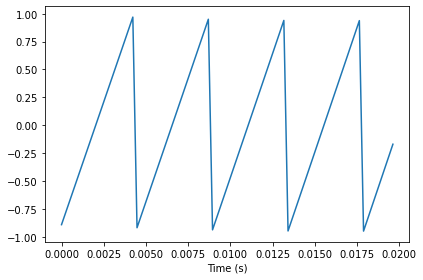

In [2]:
signal = MySawtoothChirp(start=220, end=440)
wave = signal.make_wave(duration=1, framerate=4025)
wave.segment(start=0, duration=0.02).plot() 
decorate(xlabel='Time (s)')

In [3]:
wave.apodize()
wave.make_audio()

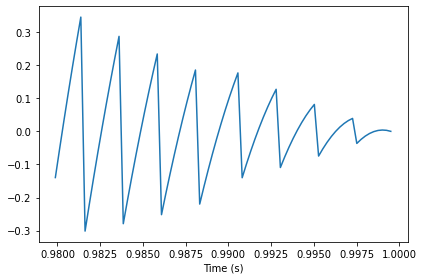

In [4]:
wave.segment(start=1-0.02, duration=0.02).plot()
decorate(xlabel='Time (s)')

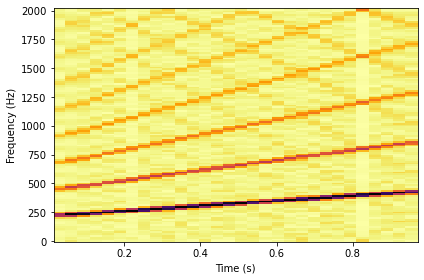

In [5]:
sp = wave.make_spectrogram(256)
sp.plot()
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')

# Exercise 3

Make a sawtooth chirp that sweeps from 2500 to 3000 Hz, then make a wave with duration 1 and framerate 20 kHz. Draw a sketch of what you think the spectrum will look like. Then plot the spectrum and see if you got it right.

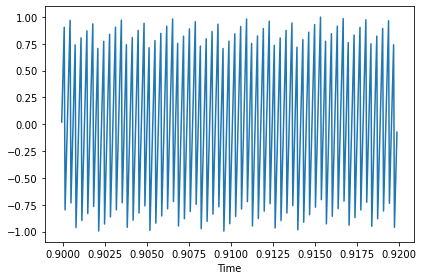

In [6]:
signal = MySawtoothChirp(start=2500, end=3000)
wave = signal.make_wave(duration=1, framerate=20_000)

wave.segment(start=0.9, duration=0.02).plot()
decorate(xlabel='Time')

In [7]:
wave.make_audio()

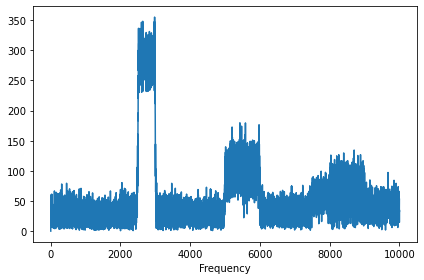

In [8]:
spectrum = wave.make_spectrum()
spectrum.plot()
decorate(xlabel='Frequency')

# Exercise 4

In musical terminology, a “glissando” is a note that slides from one pitch to another, so it is similar to a chirp. Find or make a recording of a glissando and plot its spectrogram.

One suggestion: George Gershwin's Rhapsody in Blue starts with a famous clarinet glissando; you can download a recording from http://archive.org/details/rhapblue11924.

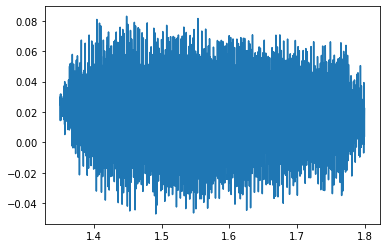

In [9]:
from thinkdsp import read_wave

wave = read_wave('rhapblue11924.wav')
segment = wave.segment(start=1.35, duration=1.8-1.35)
segment.plot()

In [10]:
wave.make_audio()

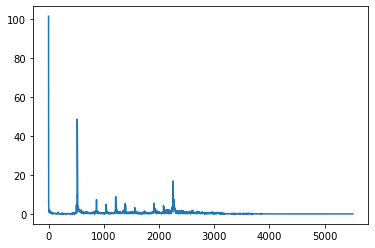

In [11]:
spectrum = segment.make_spectrum()
spectrum.plot()

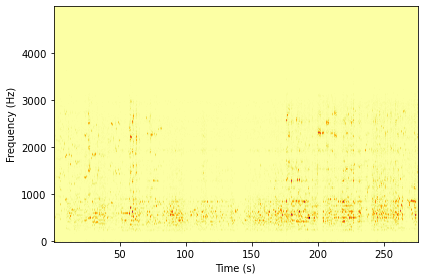

In [12]:
wave.make_spectrogram(512).plot(high=5000)
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')


# Exercise 5

A trombone player can play a glissando by extending the trombone slide while blowing continuously. As the slide extends, the total length of the tube gets longer, and the resulting pitch is inversely proportional to length. Assuming that the player moves the slide at a constant speed, how does frequency vary with time?

Write a class called TromboneGliss that extends Chirp and provides evaluate. Make a wave that simulates a trombone glissando from F3 down to C3 and back up to F3. C3 is 262 Hz; F3 is 349 Hz.

Plot a spectrogram of the resulting wave. Is a trombone glissando more like a linear or exponential chirp?

In [13]:
class MyTromboneGliss(Chirp):
    def evaluate(self, ts):
        l1, l2 = 1.0 / self.start, 1.0 / self.end
        lengths = np.linspace(l1, l2, len(ts) - 1)
        freqs = 1 / lengths
        
        dts = np.diff(ts)
        dphis = PI2 * freqs * dts
        phases = np.cumsum(dphis)
        ys = self.amp * np.cos(phases)
        return ys

In [14]:
signal = MyTromboneGliss(262, 349)
wave1 = signal.make_wave(duration=1)
wave1.apodize()
wave1.make_audio()

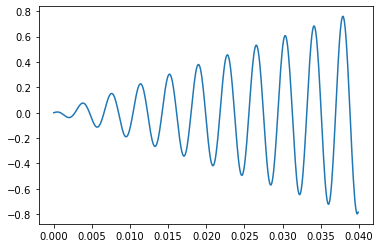

In [15]:
wave1.segment(start=0, duration=0.04).plot()

In [16]:
signal = MyTromboneGliss(349, 262)
wave2 = signal.make_wave(duration=1)
wave2.apodize()
wave2.make_audio()

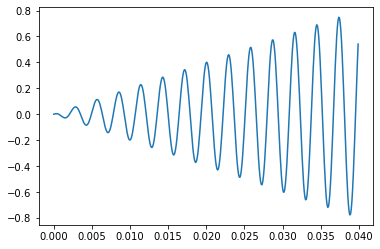

In [17]:
wave2.segment(start=0, duration=0.04).plot()

In [18]:
wave = wave1 | wave2
wave.make_audio()

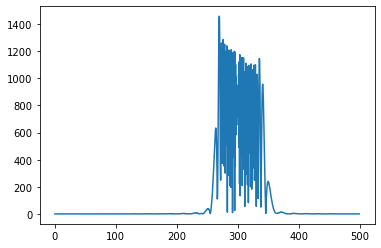

In [19]:
wave.make_spectrum().plot(high=500)

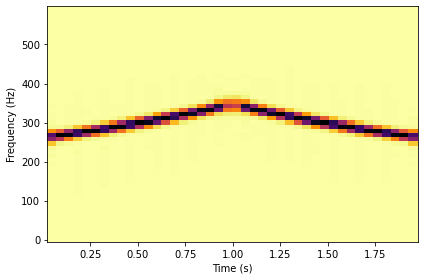

In [20]:
wave.make_spectrogram(1024).plot(high=600)
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')

# Exercise 6

Make or find a recording of a series of vowel sounds and look at the spectrogram. Can you identify different vowels?

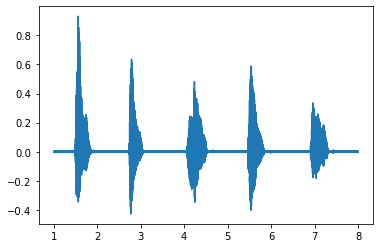

In [21]:
wave = read_wave('67703__acclivity__alphabet-male.wav')
segment = wave.segment(start=1, duration=7)
segment.plot()

In [22]:
wave.make_audio()

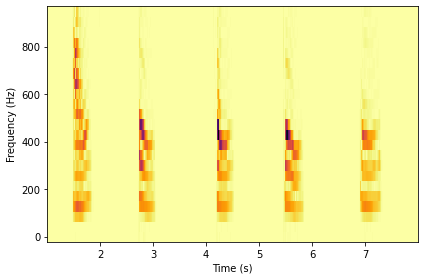

In [23]:
segment.make_spectrogram(1024).plot(high=1000)
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')

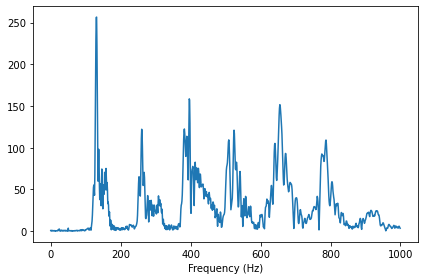

In [24]:
high = 1000

segment = wave.segment(start=1, duration=1)
segment.make_spectrum().plot(high=high)
decorate(xlabel='Frequency (Hz)')

In [25]:
segment.make_audio()

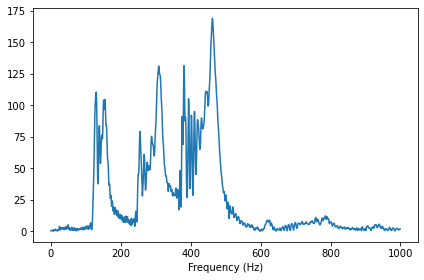

In [26]:
segment = wave.segment(start=2, duration=1)
segment.make_spectrum().plot(high=high)
decorate(xlabel='Frequency (Hz)')

In [27]:
segment.make_audio()

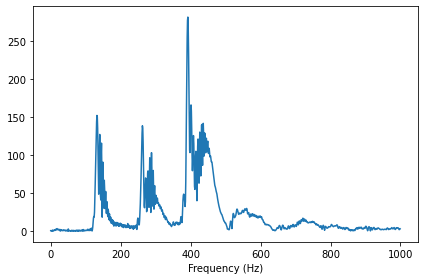

In [28]:
segment = wave.segment(start=3.5, duration=1)
segment.make_spectrum().plot(high=high)
decorate(xlabel='Frequency (Hz)')

In [29]:
segment.make_audio()

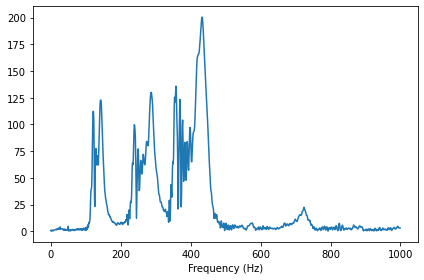

In [30]:
segment = wave.segment(start=5, duration=1)
segment.make_spectrum().plot(high=high)
decorate(xlabel='Frequency (Hz)')

In [31]:
segment.make_audio()

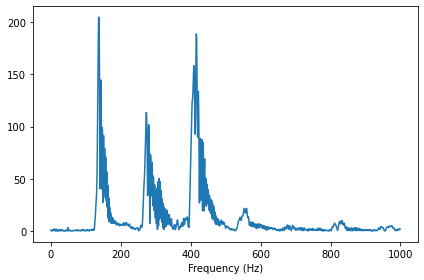

In [32]:
segment = wave.segment(start=6.5, duration=1)
segment.make_spectrum().plot(high=high)
decorate(xlabel='Frequency (Hz)')

In [33]:
segment.make_audio()